### **Requirements**

In [1]:
pip install ydata_profiling scikit-optimize optuna hyperopt ray[tune] xgboost

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.1/400.1 kB 15.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 29.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.8/107.8 kB 10.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 395.9/395.9 kB 22.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 247.0/247.0 kB 25.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.0/679.0 kB 31.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.1/70.1 MB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 2.3 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=7c6be76e71f9045e2bba3872acbbb27c3f1c22fb09046c154177c4e15acdee00
  Sto

---

# **Hyperparameter tuning model**

In this notebook I will demonstrate examples of using hyperparameter tuning models.

## **Libraries**

In [2]:
import kagglehub
import os
import pandas as pd
from ydata_profiling import ProfileReport
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold, GridSearchCV, RandomizedSearchCV
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier

from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, make_scorer, accuracy_score
from scipy.stats import randint, uniform
from skopt import BayesSearchCV
from skopt.space import Integer, Real, Categorical
from skopt.plots import plot_objective, plot_convergence, plot_evaluations

import optuna
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials

from ray import tune
from ray.tune.schedulers import PopulationBasedTraining
from ray.tune import Tuner

---

## **Dataset**

**Context**

Bob has started his own mobile company. He wants to give tough fight to big companies like Apple,Samsung etc.

He does not know how to estimate price of mobiles his company creates. In this competitive mobile phone market you cannot simply assume things. To solve this problem he collects sales data of mobile phones of various companies.

Bob wants to find out some relation between features of a mobile phone(eg:- RAM,Internal Memory etc) and its selling price. But he is not so good at Machine Learning. So he needs your help to solve this problem.

In this problem you do not have to predict actual price but a price range indicating how high the price is

In [3]:
path = kagglehub.dataset_download("yasserh/wine-quality-dataset")
os.listdir(path)

['WineQT.csv']

In [4]:
data = pd.read_csv(os.path.join(path, os.listdir(path)[0]))
new_data = data.drop(['Id'], axis=1)

In [5]:
new_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1143 entries, 0 to 1142
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1143 non-null   float64
 1   volatile acidity      1143 non-null   float64
 2   citric acid           1143 non-null   float64
 3   residual sugar        1143 non-null   float64
 4   chlorides             1143 non-null   float64
 5   free sulfur dioxide   1143 non-null   float64
 6   total sulfur dioxide  1143 non-null   float64
 7   density               1143 non-null   float64
 8   pH                    1143 non-null   float64
 9   sulphates             1143 non-null   float64
 10  alcohol               1143 non-null   float64
 11  quality               1143 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 107.3 KB


---

## **Profiling**

In [6]:
profile = ProfileReport(new_data, title="Profiling Report", explorative=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 12/12 [00:00<00:00, 117.28it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

There are duplicates in the data, and the target feature is unbalanced. In addition, there are outliers that should be removed (e.g. using the Isolation Forest method).

---

## **Preprocessing**

In [7]:
new_data = new_data.drop_duplicates().reset_index(drop=True)
new_data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1013,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1014,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6
1015,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1016,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6


In [8]:
new_data['quality'] = new_data['quality'].apply(lambda x: 0 if x <= 5 else 1)
new_data['quality'].value_counts()

,count
quality,
1,546
0,472


Since the target feature is not balanced, I decided to create new features.

1 - score above 5.

0 - all remaining scores.

In [9]:
X, y = new_data.drop(['quality'], axis=1), new_data['quality']
X.shape, y.shape

((1018, 11), (1018,))

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=.8, stratify=y)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((814, 11), (204, 11), (814,), (204,))

I chose to use a stratified split because it allows the model to perform better on my dataset, which is relatively small.

## **Models**

I plan to use the GradientBoostingClassifier model. While I am aware that more advanced models exist—many of which support GPU acceleration, unlike the implementation available in scikit-learn.

class **[sklearn.ensemble.GradientBoostingClassifier](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingClassifier.html#sklearn.ensemble.GradientBoostingClassifier)**(**, loss='log_loss', learning_rate=0.1, n_estimators=100, subsample=1.0, criterion='friedman_mse', min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_depth=3, min_impurity_decrease=0.0, init=None, random_state=None, max_features=None, verbose=0, max_leaf_nodes=None, warm_start=False, validation_fraction=0.1, n_iter_no_change=None, tol=0.0001, ccp_alpha=0.0*)

In [11]:
skf = StratifiedKFold(n_splits=5, shuffle=True)

In [12]:
boost = GradientBoostingClassifier(n_estimators=100)
scores = cross_val_score(boost, X_train, y_train, cv=skf, scoring='accuracy')
scores

array([0.7791411 , 0.70552147, 0.77300613, 0.72392638, 0.75925926])

In [13]:
boost.fit(X_train, y_train)

GradientBoostingClassifier()

In [14]:
y_pred = boost.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.70      0.75      0.72        95
           1       0.76      0.72      0.74       109

    accuracy                           0.73       204
   macro avg       0.73      0.73      0.73       204
weighted avg       0.73      0.73      0.73       204



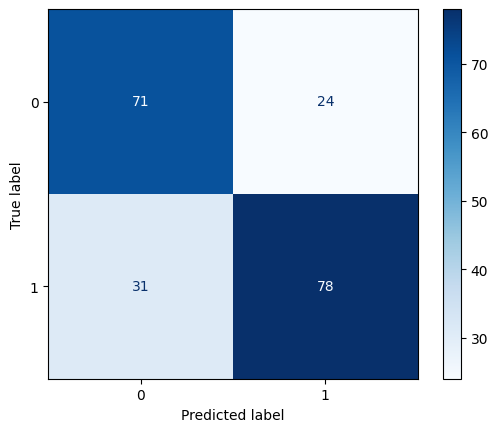

In [15]:
ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred), display_labels=boost.classes_).plot(cmap='Blues', values_format='d')
plt.show()

### **GridSearchCV**

GridSearchCV is the simplest way to tune model hyperparameters. You define a range of parameters to test, and GridSearchCV iterates through all possible combinations in a grid to find the best one.

In [16]:
boost = GradientBoostingClassifier()

In [23]:
parameters = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05],
    'max_depth': [3, 5, 7],
    'subsample': [0.6, 0.8, 1.0],
    'min_samples_split': [5, 10],
    'max_features': [None, 'sqrt', 'log2']
}

In [24]:
grid_search = GridSearchCV(estimator=boost,
                           param_grid=parameters,
                           cv=skf,
                           scoring='accuracy',
                           n_jobs=-1)
grid_search.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=True),
             estimator=GradientBoostingClassifier(), n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.05], 'max_depth': [3, 5, 7],
                         'max_features': [None, 'sqrt', 'log2'],
                         'min_samples_split': [5, 10],
                         'n_estimators': [100, 200, 300],
                         'subsample': [0.6, 0.8, 1.0]},
             scoring='accuracy')

*Parameter selection took 15 minutes*

**Best parameters**

In [25]:
grid_search.best_params_

{'learning_rate': 0.01,
 'max_depth': 3,
 'max_features': 'sqrt',
 'min_samples_split': 10,
 'n_estimators': 300,
 'subsample': 0.6}

**Reports**

In [26]:
y_pred = grid_search.best_estimator_.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.71      0.76      0.73        95
           1       0.78      0.73      0.75       109

    accuracy                           0.75       204
   macro avg       0.74      0.75      0.74       204
weighted avg       0.75      0.75      0.75       204



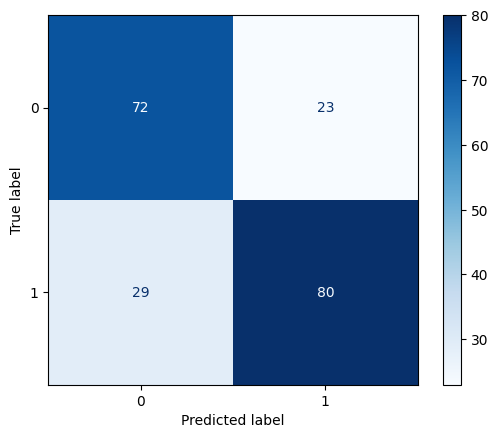

In [27]:
ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred), display_labels=grid_search.best_estimator_.classes_).plot(cmap='Blues', values_format='d')
plt.show()

### **RandomizedSearchCV**

RandomizedSearchCV is often considered more efficient than GridSearchCV. It typically converges faster and has a higher probability of identifying optimal or near-optimal model parameters.

In [28]:
parameters = {'n_estimators': randint(50, 300),
    'learning_rate': uniform(0.01, 0.2),
    'max_depth': randint(3, 10),
    'subsample': uniform(0.7, 0.3),
    'min_samples_split': randint(2, 10),
    'max_features': [None, 'sqrt', 'log2']
              }

In [37]:
random_search = RandomizedSearchCV(boost,
                                   param_distributions=parameters,
                                   n_iter=50,
                                   cv=skf,
                                   scoring='accuracy',
                                   random_state=42,
                                   n_jobs=-1)
random_search.fit(X_train, y_train)

RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=True),
                   estimator=GradientBoostingClassifier(), n_iter=50, n_jobs=-1,
                   param_distributions={'learning_rate': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7eb734ea7110>,
                                        'max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7eb734e73c50>,
                                        'max_features': [None, 'sqrt', 'log2'],
                                        'min_samples_split': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7eb734e58e50>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7eb733fbd150>,
                                        'subsample': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7eb734e59ed0>},
                   random_state=42, scoring='accuracy')

*Parameter selection took 2 minutes*

**Best parameters**

In [38]:
random_search.best_params_

{'learning_rate': np.float64(0.04224425745080089),
 'max_depth': 4,
 'max_features': 'sqrt',
 'min_samples_split': 6,
 'n_estimators': 111,
 'subsample': np.float64(0.890021126953127)}

**Reports**

In [39]:
y_pred = random_search.best_estimator_.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.70      0.75      0.72        95
           1       0.77      0.72      0.75       109

    accuracy                           0.74       204
   macro avg       0.73      0.74      0.73       204
weighted avg       0.74      0.74      0.74       204



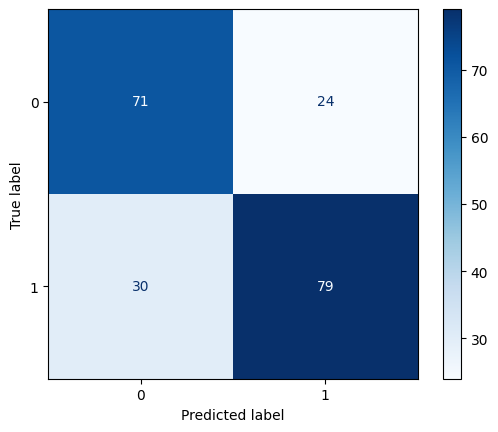

In [40]:
ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred), display_labels=random_search.best_estimator_.classes_).plot(cmap='Blues', values_format='d')
plt.show()

### **Bayesian optimization**

This optimizer aims to balance exploration and exploitation. Using the information from previously evaluated points, it constructs a probabilistic model of the objective function (commonly through methods such as Gaussian Processes). An acquisition function then selects the next candidate point to evaluate, guiding the search toward promising areas of the parameter space.

In [41]:
search_spaces = {
    "n_estimators": Integer(50, 300),
    "learning_rate": Real(1e-2, 2e-1, prior="log-uniform"),
    "max_depth": Integer(3, 7),
    "subsample": Real(0.8, 1.0, prior="uniform"),
    "min_samples_split": Integer(2, 10),
    "max_features": Categorical([None, "sqrt", "log2"]),
}

In [42]:
opt = BayesSearchCV(
    estimator = boost,
    search_spaces = search_spaces,
    n_iter = 50,
    scoring = 'accuracy',
    cv = skf,
    n_jobs = -1,
    random_state = 42,
    verbose = 0,
)

opt.fit(X_train, y_train)

BayesSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=True),
              estimator=GradientBoostingClassifier(), n_jobs=-1,
              random_state=42, scoring='accuracy',
              search_spaces={'learning_rate': Real(low=0.01, high=0.2, prior='log-uniform', transform='normalize'),
                             'max_depth': Integer(low=3, high=7, prior='uniform', transform='normalize'),
                             'max_features': Categorical(categories=(None, 'sqrt', 'log2'), prior=None),
                             'min_samples_split': Integer(low=2, high=10, prior='uniform', transform='normalize'),
                             'n_estimators': Integer(low=50, high=300, prior='uniform', transform='normalize'),
                             'subsample': Real(low=0.8, high=1.0, prior='uniform', transform='normalize')})

*Parameter selection took 5 minutes*

**Best parameters**

In [45]:
opt.best_params_

OrderedDict([('learning_rate', 0.011110819706191483),
             ('max_depth', 6),
             ('max_features', 'log2'),
             ('min_samples_split', 7),
             ('n_estimators', 296),
             ('subsample', 0.8038200905982963)])

**Reports**

In [47]:
y_pred = opt.best_estimator_.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.71      0.77      0.74        95
           1       0.78      0.72      0.75       109

    accuracy                           0.75       204
   macro avg       0.75      0.75      0.74       204
weighted avg       0.75      0.75      0.75       204



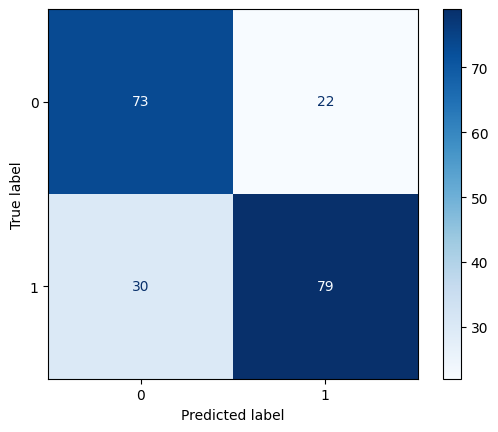

In [48]:
ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred), display_labels=random_search.best_estimator_.classes_).plot(cmap='Blues', values_format='d')
plt.show()

**Parameter analysis**

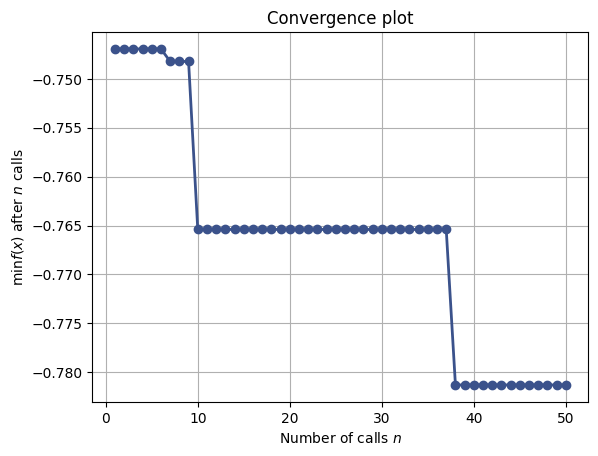

In [43]:
fig = plot_convergence(opt.optimizer_results_[0])
plt.show()

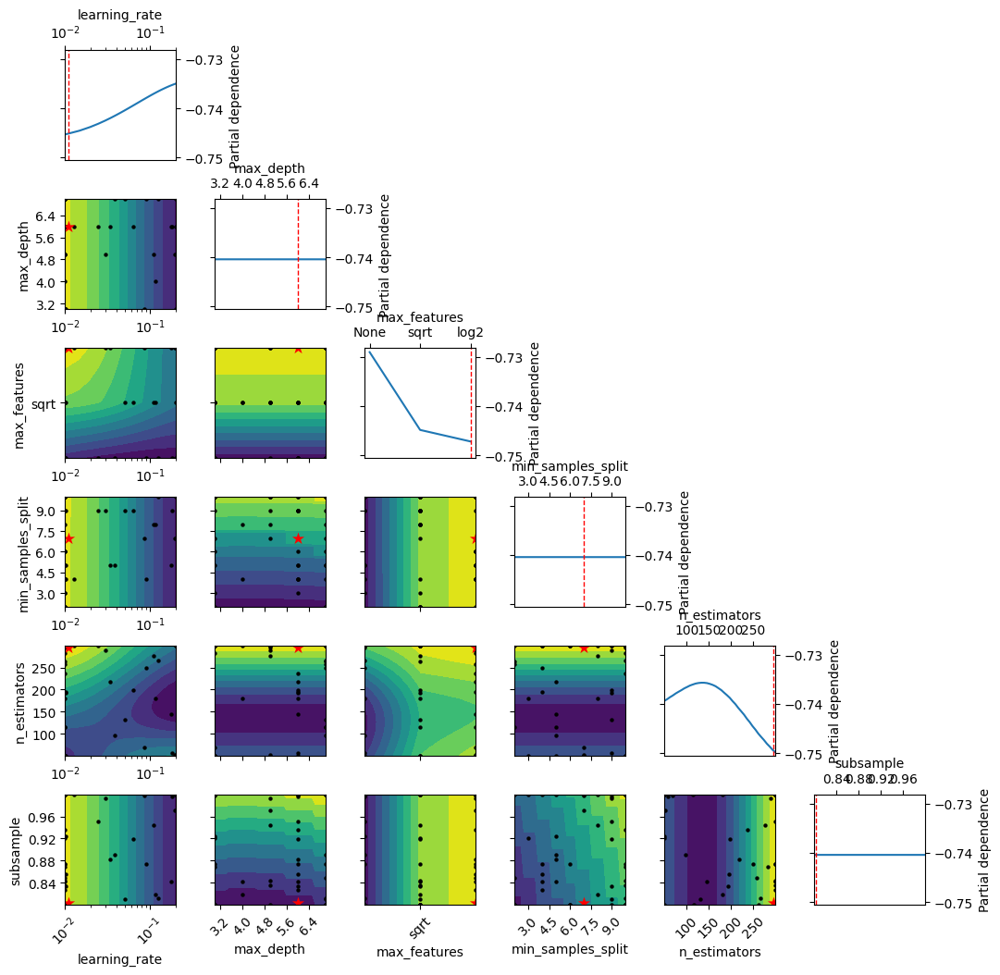

In [44]:
plot_objective(opt.optimizer_results_[0])
plt.show()

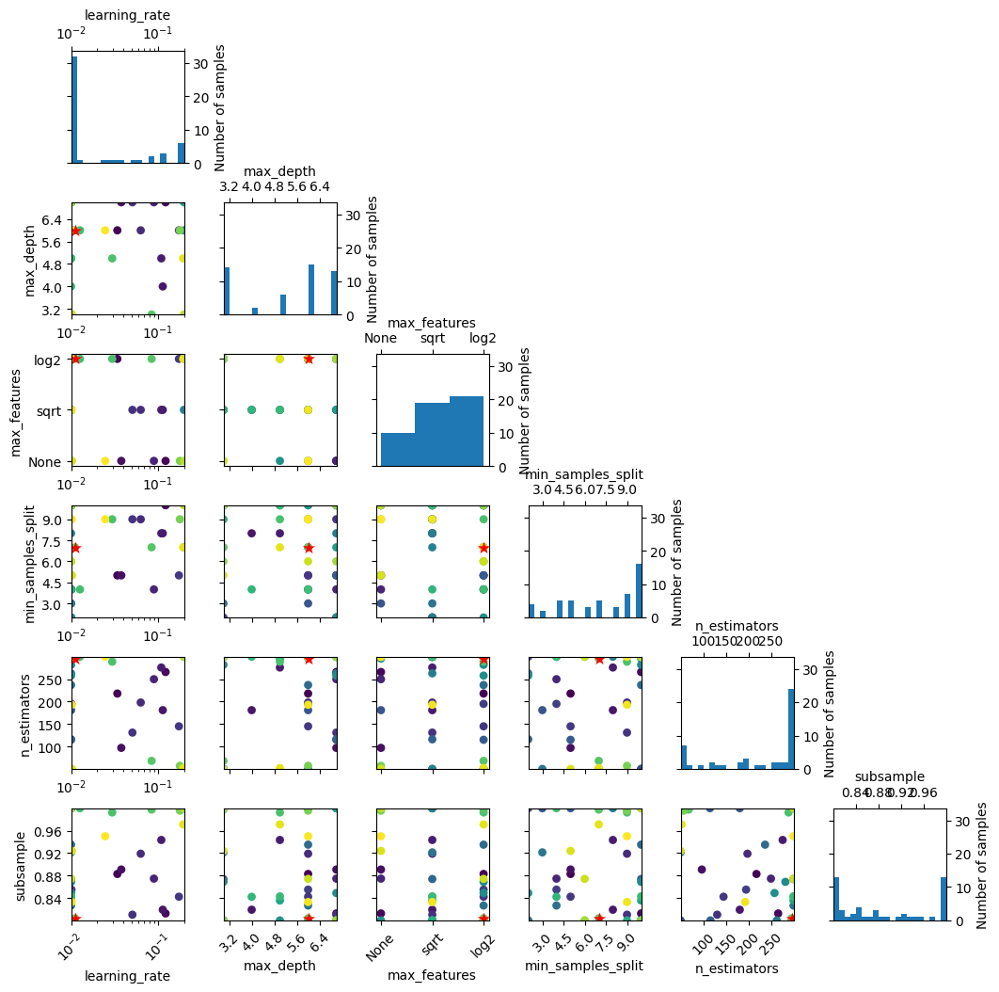

In [46]:
plot_evaluations(opt.optimizer_results_[0])
plt.show()

### **Tree-structured Parzen Estimator (TPE)**

The Tree-structured Parzen Estimator (TPE) is an iterative Bayesian optimization algorithm for hyperparameter tuning. It builds two probability density models: one for the "best" observed objective values and one for the "worst." It then chooses the next set of parameters by maximizing the ratio between these two densities.

#### **Hyperopt**

In [54]:
space = {
    'n_estimators': hp.quniform('n_estimators', 50, 300, 10),
    'learning_rate': hp.loguniform('learning_rate', np.log(0.001), np.log(0.3)),
    'max_depth': hp.quniform('max_depth', 3, 10, 1),
    'subsample': hp.uniform('subsample', 0.5, 1.0),
    'min_samples_split': hp.quniform('min_samples_split', 2, 20, 1),
    'max_features': hp.choice('max_features', [None, 'sqrt', 'log2']),
}

In [55]:
def objective(params):
    params['n_estimators'] = int(params['n_estimators'])
    params['max_depth'] = int(params['max_depth'])
    params['min_samples_split'] = int(params['min_samples_split'])

    model = GradientBoostingClassifier(**params)
    acc = cross_val_score(model, X_train, y_train, cv=skf, scoring='accuracy').mean()
    return {'loss': -acc, 'status': STATUS_OK}

In [56]:
trials = Trials()
best = fmin(fn=objective,
            space=space,
            algo=tpe.suggest,
            max_evals=50,
            trials=trials,
            rstate=np.random.default_rng(42))

100%|██████████| 50/50 [02:58<00:00,  3.57s/trial, best loss: -0.7715216238733621]


*Parameter selection took 3 minutes*

**Best parameters**

In [57]:
best

{'learning_rate': np.float64(0.015407096720155179),
 'max_depth': np.float64(9.0),
 'max_features': np.int64(1),
 'min_samples_split': np.float64(14.0),
 'n_estimators': np.float64(140.0),
 'subsample': np.float64(0.7076156489847966)}

**Reports**

In [58]:
best['n_estimators'] = int(best['n_estimators'])
best['max_depth'] = int(best['max_depth'])
best['min_samples_split'] = int(best['min_samples_split'])

In [59]:
model = GradientBoostingClassifier(**best)
model.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=np.float64(0.015407096720155179),
                           max_depth=9, max_features=np.int64(1),
                           min_samples_split=14, n_estimators=140,
                           subsample=np.float64(0.7076156489847966))

In [60]:
y_pred = model.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.71      0.75      0.73        95
           1       0.77      0.73      0.75       109

    accuracy                           0.74       204
   macro avg       0.74      0.74      0.74       204
weighted avg       0.74      0.74      0.74       204



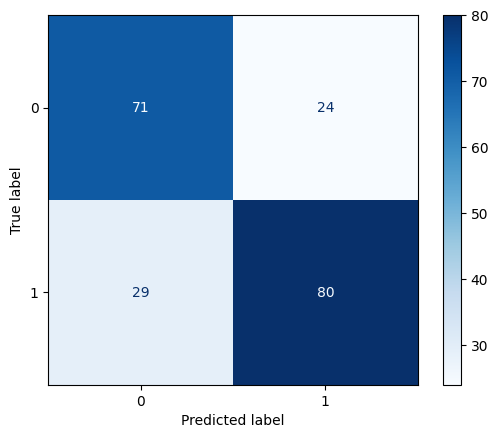

In [61]:
ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred), display_labels=random_search.best_estimator_.classes_).plot(cmap='Blues', values_format='d')
plt.show()

#### **Optuna**

In [64]:
def objective(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 300),
        'learning_rate': trial.suggest_float('learning_rate', 1e-3, 0.3, log=True),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
        'max_features': trial.suggest_categorical('max_features', [None, 'sqrt', 'log2']),
    }

    model = GradientBoostingClassifier(**params)
    score = cross_val_score(model, X_train, y_train, cv=skf, scoring='accuracy').mean()
    return score

In [65]:
study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=42))
study.optimize(objective, n_trials=50)

[I 2025-07-21 02:57:01,141] A new study created in memory with name: no-name-b704efdf-c051-4a09-8205-5cc3bca06bd2
[I 2025-07-21 02:57:07,064] Trial 0 finished with value: 0.7420131788229947 and parameters: {'n_estimators': 144, 'learning_rate': 0.22648248189516848, 'max_depth': 8, 'subsample': 0.7993292420985183, 'min_samples_split': 4, 'max_features': 'log2'}. Best is trial 0 with value: 0.7420131788229947.
[I 2025-07-21 02:57:10,158] Trial 1 finished with value: 0.7481784442929637 and parameters: {'n_estimators': 200, 'learning_rate': 0.05675206026988748, 'max_depth': 3, 'subsample': 0.9849549260809971, 'min_samples_split': 17, 'max_features': None}. Best is trial 1 with value: 0.7481784442929637.
[I 2025-07-21 02:57:12,082] Trial 2 finished with value: 0.7445807770961145 and parameters: {'n_estimators': 126, 'learning_rate': 0.0199473547030745, 'max_depth': 6, 'subsample': 0.645614570099021, 'min_samples_split': 13, 'max_features': 'log2'}. Best is trial 1 with value: 0.748178444292

*Parameter selection took 3 minutes*

**Best parameters**

In [66]:
best_params = study.best_params
best_score = study.best_value
best_params, best_score

({'n_estimators': 238,
  'learning_rate': 0.009072505528844435,
  'max_depth': 6,
  'subsample': 0.9140216722655722,
  'min_samples_split': 16,
  'max_features': 'log2'},
 0.7702719078997198)

**Reports**

In [68]:
model = GradientBoostingClassifier(**best_params)
model.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=0.009072505528844435, max_depth=6,
                           max_features='log2', min_samples_split=16,
                           n_estimators=238, subsample=0.9140216722655722)

In [69]:
y_pred = model.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.70      0.75      0.72        95
           1       0.77      0.72      0.75       109

    accuracy                           0.74       204
   macro avg       0.73      0.74      0.73       204
weighted avg       0.74      0.74      0.74       204



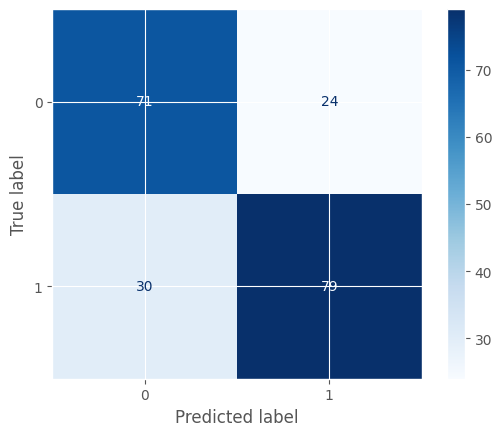

In [70]:
ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred), display_labels=random_search.best_estimator_.classes_).plot(cmap='Blues', values_format='d')
plt.show()

**Parameter analysis**

/tmp/ipython-input-67-1283150298.py:3: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  fig1 = optuna.visualization.matplotlib.plot_optimization_history(study)
/tmp/ipython-input-67-1283150298.py:6: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  fig2 = optuna.visualization.matplotlib.plot_param_importances(study)


[<Axes: title={'center': 'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>,
 <Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>]

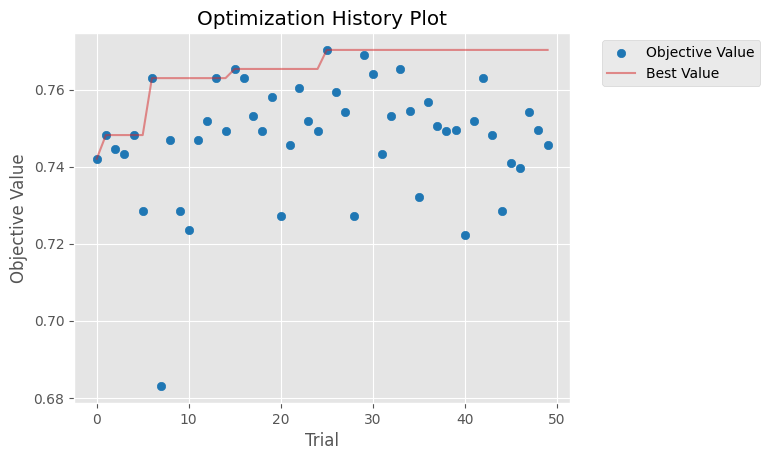

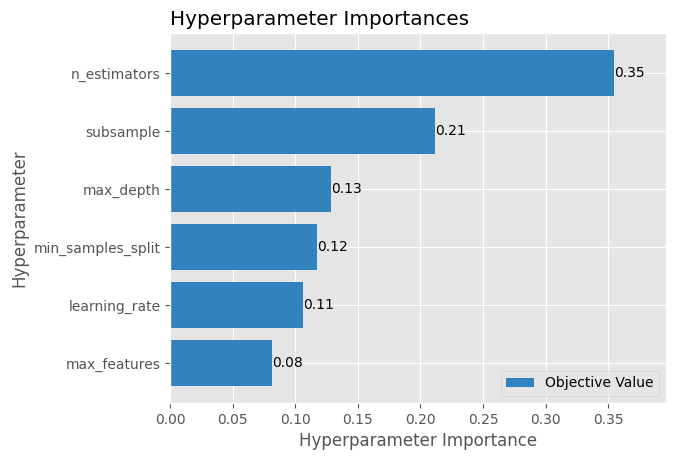

In [67]:
figs = []

fig1 = optuna.visualization.matplotlib.plot_optimization_history(study)
figs.append(fig1)

fig2 = optuna.visualization.matplotlib.plot_param_importances(study)
figs.append(fig2)

figs

### **Population Based Training (PBT)**

Population Based Training (PBT) is a method that trains many models at the same time and adjusts both their settings (parameters) and tuning options (hyperparameters). Unlike training each model separately, in PBT models share information with each other during training. If a model is not doing well, it can copy the settings of a better model and try to improve. This helps find good settings faster and makes training more efficient.

In [71]:
def train_model(config):
    X_t, X_val, y_t, y_val = train_test_split(
        X_train, y_train, test_size=0.2, random_state=42
    )

    model = GradientBoostingClassifier(
        learning_rate=float(config["learning_rate"]),
        n_estimators=int(config["n_estimators"]),
        max_depth=int(config["max_depth"]),
        subsample=float(config["subsample"]),
        min_samples_split=int(config["min_samples_split"]),
        max_features=config["max_features"]
    )
    model.fit(X_t, y_t)

    y_pred = model.predict(X_val)
    acc = accuracy_score(y_val, y_pred)

    print(f"Accuracy: {acc}")
    tune.report({"mean_accuracy": acc})


In [72]:
pbt = PopulationBasedTraining(
    time_attr="training_iteration",
    metric="mean_accuracy",
    mode="max",
    perturbation_interval=1,
    hyperparam_mutations={
        "learning_rate": lambda: np.random.uniform(0.001, 0.3),
        "n_estimators": [50, 100, 150, 200, 250, 300],
        "max_depth": [3, 4, 5, 6, 7, 8, 9, 10],
        "subsample": lambda: np.random.uniform(0.5, 1.0),
        "min_samples_split": [2, 5, 10, 15, 20],
        "max_features": [None, "sqrt", "log2"]
    }
)

In [73]:
tuner = tune.Tuner(
    train_model,
    tune_config=tune.TuneConfig(
        scheduler=pbt,
        num_samples=25,
    ),
    param_space={
        "learning_rate": tune.uniform(0.001, 0.3),
        "n_estimators": tune.choice([50, 100, 150, 200, 250, 300]),
        "max_depth": tune.choice([3, 4, 5, 6, 7, 8, 9, 10]),
        "subsample": tune.uniform(0.5, 1.0),
        "min_samples_split": tune.choice([2, 5, 10, 15, 20]),
        "max_features": tune.choice([None, "sqrt", "log2"]),
    },
)

In [74]:
results = tuner.fit()
best_result = results.get_best_result(metric="mean_accuracy", mode="max")


2025-07-21 03:03:39,329	INFO worker.py:1927 -- Started a local Ray instance.
2025-07-21 03:03:42,757	INFO tune.py:253 -- Initializing Ray automatically. For cluster usage or custom Ray initialization, call `ray.init(...)` before `Tuner(...)`.
/usr/local/lib/python3.11/dist-packages/ray/tune/tune.py:730: UserWarning: Consider boosting PBT performance by enabling `reuse_actors` as well as implementing `reset_config` for Trainable.
  warnings.warn(


+--------------------------------------------------------------------+
| Configuration for experiment     train_model_2025-07-21_03-03-32   |
+--------------------------------------------------------------------+
| Search algorithm                 BasicVariantGenerator             |
| Scheduler                        PopulationBasedTraining           |
| Number of trials                 25                                |
+--------------------------------------------------------------------+

View detailed results here: /root/ray_results/train_model_2025-07-21_03-03-32
To visualize your results with TensorBoard, run: `tensorboard --logdir /tmp/ray/session_2025-07-21_03-03-34_411135_751/artifacts/2025-07-21_03-03-42/train_model_2025-07-21_03-03-32/driver_artifacts`

Trial status: 25 PENDING
Current time: 2025-07-21 03:03:48. Total running time: 0s
Logical resource usage: 0/2 CPUs, 0/0 GPUs
+-------------------------------------------------------------------------------------------------

2025-07-21 03:03:59,584	INFO pbt.py:716 -- [pbt]: no checkpoint for trial train_model_4f1c4_00001. Skip exploit for Trial train_model_4f1c4_00000



Trial train_model_4f1c4_00002 started with configuration:
+--------------------------------------------------+
| Trial train_model_4f1c4_00002 config             |
+--------------------------------------------------+
| learning_rate                            0.00882 |
| max_depth                                      9 |
| max_features                                     |
| min_samples_split                              2 |
| n_estimators                                 100 |
| subsample                                0.60466 |
+--------------------------------------------------+


2025-07-21 03:04:03,970	INFO pbt.py:716 -- [pbt]: no checkpoint for trial train_model_4f1c4_00001. Skip exploit for Trial train_model_4f1c4_00002


(train_model pid=28094) Accuracy: 0.7361963190184049 [repeated 2x across cluster] (Ray deduplicates logs by default. Set RAY_DEDUP_LOGS=0 to disable log deduplication, or see https://docs.ray.io/en/master/ray-observability/user-guides/configure-logging.html#log-deduplication for more options.)

Trial train_model_4f1c4_00003 started with configuration:
+--------------------------------------------------+
| Trial train_model_4f1c4_00003 config             |
+--------------------------------------------------+
| learning_rate                            0.17581 |
| max_depth                                      9 |
| max_features                                     |
| min_samples_split                             20 |
| n_estimators                                 200 |
| subsample                                 0.8883 |
+--------------------------------------------------+

Trial train_model_4f1c4_00004 started with configuration:
+--------------------------------------------------+
| Tr

2025-07-21 03:04:23,262	INFO pbt.py:716 -- [pbt]: no checkpoint for trial train_model_4f1c4_00004. Skip exploit for Trial train_model_4f1c4_00007



Trial train_model_4f1c4_00008 started with configuration:
+--------------------------------------------------+
| Trial train_model_4f1c4_00008 config             |
+--------------------------------------------------+
| learning_rate                            0.21529 |
| max_depth                                      4 |
| max_features                                     |
| min_samples_split                              5 |
| n_estimators                                 250 |
| subsample                                0.78826 |
+--------------------------------------------------+

Trial train_model_4f1c4_00009 started with configuration:
+--------------------------------------------------+
| Trial train_model_4f1c4_00009 config             |
+--------------------------------------------------+
| learning_rate                            0.16117 |
| max_depth                                     10 |
| max_features                                log2 |
| min_samples_split               

2025-07-21 03:04:38,994	INFO pbt.py:716 -- [pbt]: no checkpoint for trial train_model_4f1c4_00008. Skip exploit for Trial train_model_4f1c4_00011


(train_model pid=28785) Accuracy: 0.7423312883435583 [repeated 2x across cluster]

Trial train_model_4f1c4_00012 started with configuration:
+--------------------------------------------------+
| Trial train_model_4f1c4_00012 config             |
+--------------------------------------------------+
| learning_rate                            0.27656 |
| max_depth                                     10 |
| max_features                                sqrt |
| min_samples_split                             20 |
| n_estimators                                 250 |
| subsample                                0.96021 |
+--------------------------------------------------+
(train_model pid=28928) Accuracy: 0.7791411042944786 [repeated 2x across cluster]

Trial train_model_4f1c4_00013 started with configuration:
+--------------------------------------------------+
| Trial train_model_4f1c4_00013 config             |
+--------------------------------------------------+
| learning_rate              

2025-07-21 03:05:02,811	INFO pbt.py:716 -- [pbt]: no checkpoint for trial train_model_4f1c4_00012. Skip exploit for Trial train_model_4f1c4_00017


(train_model pid=29280) Accuracy: 0.7361963190184049 [repeated 2x across cluster]

Trial train_model_4f1c4_00018 started with configuration:
+--------------------------------------------------+
| Trial train_model_4f1c4_00018 config             |
+--------------------------------------------------+
| learning_rate                            0.04261 |
| max_depth                                      9 |
| max_features                                log2 |
| min_samples_split                             20 |
| n_estimators                                 150 |
| subsample                                0.65745 |
+--------------------------------------------------+
(train_model pid=29417) Accuracy: 0.7975460122699386 [repeated 2x across cluster]

Trial train_model_4f1c4_00019 started with configuration:
+--------------------------------------------------+
| Trial train_model_4f1c4_00019 config             |
+--------------------------------------------------+
| learning_rate              

2025-07-21 03:05:16,689	INFO pbt.py:716 -- [pbt]: no checkpoint for trial train_model_4f1c4_00013. Skip exploit for Trial train_model_4f1c4_00019


(train_model pid=29455) Accuracy: 0.7484662576687117

Trial status: 20 PAUSED | 5 PENDING
Current time: 2025-07-21 03:05:19. Total running time: 1min 30s
Logical resource usage: 1.0/2 CPUs, 0/0 GPUs
+---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                status       learning_rate     n_estimators     max_depth     subsample     min_samples_split   max_features          acc     iter     total time (s) |
+---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| train_model_4f1c4_00000   PAUSED          0.00337963              250            10      0.939214                    20                    0.754601        1           5.69765  |
| train_model_4f1c4_00001   PAUSED          0.199071                200          

2025-07-21 03:05:23,407	INFO pbt.py:716 -- [pbt]: no checkpoint for trial train_model_4f1c4_00012. Skip exploit for Trial train_model_4f1c4_00020


(train_model pid=29547) Accuracy: 0.7361963190184049

Trial train_model_4f1c4_00021 started with configuration:
+--------------------------------------------------+
| Trial train_model_4f1c4_00021 config             |
+--------------------------------------------------+
| learning_rate                            0.03553 |
| max_depth                                      7 |
| max_features                                sqrt |
| min_samples_split                             10 |
| n_estimators                                 250 |
| subsample                                0.93425 |
+--------------------------------------------------+


2025-07-21 03:05:29,058	INFO pbt.py:716 -- [pbt]: no checkpoint for trial train_model_4f1c4_00004. Skip exploit for Trial train_model_4f1c4_00021


(train_model pid=29656) Accuracy: 0.7361963190184049

Trial train_model_4f1c4_00022 started with configuration:
+--------------------------------------------------+
| Trial train_model_4f1c4_00022 config             |
+--------------------------------------------------+
| learning_rate                            0.00321 |
| max_depth                                      3 |
| max_features                                     |
| min_samples_split                             10 |
| n_estimators                                 250 |
| subsample                                0.53104 |
+--------------------------------------------------+
(train_model pid=29747) Accuracy: 0.7607361963190185

Trial train_model_4f1c4_00023 started with configuration:
+--------------------------------------------------+
| Trial train_model_4f1c4_00023 config             |
+--------------------------------------------------+
| learning_rate                            0.21542 |
| max_depth                       

2025-07-21 03:07:46,917	INFO tune.py:1009 -- Wrote the latest version of all result files and experiment state to '/root/ray_results/train_model_2025-07-21_03-03-32' in 0.0185s.



Trial train_model_4f1c4_00024 completed after 1 iterations at 2025-07-21 03:07:46. Total running time: 3min 58s
+--------------------------------------------------+
| Trial train_model_4f1c4_00024 result             |
+--------------------------------------------------+
| checkpoint_dir_name                              |
| time_this_iter_s                         1.15396 |
| time_total_s                             1.15396 |
| training_iteration                             1 |
| mean_accuracy                            0.74847 |
+--------------------------------------------------+

Trial status: 25 TERMINATED
Current time: 2025-07-21 03:07:46. Total running time: 3min 58s
Logical resource usage: 1.0/2 CPUs, 0/0 GPUs
+-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                status         learning_rate     n_estimators     max_depth   

*Parameter selection took 3 minutes*

**Best parameters**

In [75]:
best_result = results.get_best_result(metric="mean_accuracy", mode="max")
print("Best hyperparameters found were: ", best_result.config)
print("Best accuracy: ", best_result.metrics["mean_accuracy"])

Best hyperparameters found were:  {'learning_rate': 0.011579594865041981, 'n_estimators': 150, 'max_depth': 5, 'subsample': 0.5051971690748793, 'min_samples_split': 5, 'max_features': 'sqrt'}
Best accuracy:  0.803680981595092


**Reports**

In [76]:
model = GradientBoostingClassifier(**best_result.config)
model.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=0.011579594865041981, max_depth=5,
                           max_features='sqrt', min_samples_split=5,
                           n_estimators=150, subsample=0.5051971690748793)

In [77]:
y_pred = model.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.71      0.74      0.73        95
           1       0.76      0.74      0.75       109

    accuracy                           0.74       204
   macro avg       0.74      0.74      0.74       204
weighted avg       0.74      0.74      0.74       204



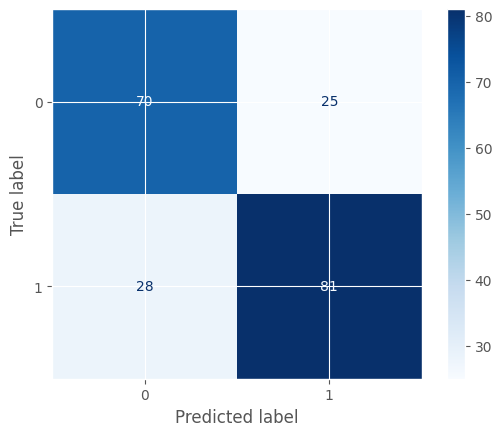

In [78]:
ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred), display_labels=random_search.best_estimator_.classes_).plot(cmap='Blues', values_format='d')
plt.show()